In [1]:
import import_ipynb
import Scanpy_functions_v03262021 as sc_pipe
import scvelo as scv
scv.logging.print_version()
import warnings
import scirpy as ir
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import bbknn
import logging
from sklearn.mixture import GaussianMixture
from scipy.stats     import norm
import glob
import os
import hvplot.pandas
import docx
from docx import Document
from docx.shared import Inches
from docx.shared import Pt
from scipy import sparse
import scanpy.external as sce
import holoviews as hv
import panel as pn
import bokeh
from bokeh.resources import INLINE
import scanorama
import gseapy

importing Jupyter notebook from Scanpy_functions_v03262021.ipynb
Running scvelo 0.2.5.dev5+g1805ab4 (python 3.8.12) on 2022-06-27 10:13.
Running scvelo 0.2.5.dev5+g1805ab4 (python 3.8.12) on 2022-06-27 10:14.


In [2]:
# define sample metadata. Usually read from a file.
exclude_genes = ['RPL', 'RPS', 'TRAV', 'TRAJ', 'TRBJ', 'TRBV','MRP','FAU','DAP3','UBA52','IGHV', 'IGKV', 'IGLV','MALAT1']


In_path = '/user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/'

out_path = '/user/ifrec/liuyuchen/Analysis_Reports/Akira_Fukusima_scRNASeq/human/'

In [3]:
#sc.set_figure_params(scanpy=True, dpi=200,  figsize=[12.8,9.6])
sc.settings.verbosity = 3

In [4]:
samples = {}
sample_list = In_path+'sample_list.txt'
for line in open(sample_list):
    tag= line.strip()
    samples[tag] ={}

In [5]:
adata_list = sc_pipe.data_IO(samples,In_path,IG=False,Velo=True)

... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-09_5DE-velocyto-BAL_TY-09_5DE.h5ad
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-09_5DE/outs/filtered_feature_bc_matrix.h5
 (0:00:02)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-10_5DE-velocyto-BAL_TY-10_5DE.h5ad
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-10_5DE/outs/filtered_feature_bc_matrix.h5
 (0:00:02)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-11_5DE-velocyto-BAL_TY-11_5DE.h5ad
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-11_5DE/outs/filtered_feature_bc_matrix.h5
 (0:00:02)
... reading from cache file cache/user-ifrec-liuyuchen-scRNASeq_DATA-Akira_Fukusima_scRNASeq-human-BAL_TY-12_5DE-velocyto-BAL_TY-12_5DE.h5ad
reading /user/ifrec/liuyuchen/scRN

reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/TY30_PBMC_5DE/outs/filtered_feature_bc_matrix.h5
 (0:00:01)


In [6]:
adata_list[1]

AnnData object with n_obs × n_vars = 18417 × 36601
    obs: 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'Sample'
    var: 'gene_ids', 'feature_types', 'genome', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [7]:
adata = sc_pipe.unify_value(adata_list)

In [8]:
adata.obs['Sample'].value_counts()

PBMC_TY38_5DE         22050
TY27_BAL_5DE          20450
Lung_HN-1_5DE         19160
BAL_TY-10_5DE         18417
BAL_TY-2_5DE          18366
BAL_TY-14_5DE         18137
PBMC_Healthy-3_5DE    17096
BAL_TY-20_5DE         16947
Lung_HN-2_5DE         16872
BAL_TY-7_5DE          16816
BAL_TY-12_5DE         16158
BAL_TY-11_5DE         15547
BAL_TY-09_5DE         14277
BAL_TY-4_5DE          13488
BAL_TY-17_5DE         13414
TY30_PBMC_5DE         13288
BAL_TY-8_5DE          12131
BAL_TY-44_5DE         12091
BAL_TY-19_5DE         11629
PBMC_TY-44_5DE        11492
BAL_TY-3_5DE          11415
BAL_TY-6_5DE          11391
BAL_TY-5_5DE          11264
BAL_TY-38_5DE         10036
BAL_TY-16_5DE          9111
TY28_BAL_5DE           8679
BAL_TY-1_5DE           8600
BAL_TY-25_5DE          7968
BAL_TY-15_5DE          7689
Lung_HN10_5DE          6142
BAL_TY-13_5DE          4894
TY26_BAL_5DE           4532
Name: Sample, dtype: int64

In [9]:
del adata_list

normalizing counts per cell
    finished (0:00:13)


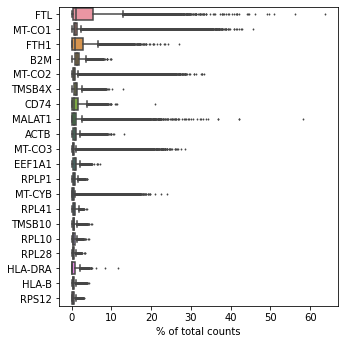

Running Scrublet
filtered out 6824 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:05)
extracting highly variable genes
    finished (0:00:14)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:02)
Embedding transcriptomes using PCA...
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 9.7%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 1.1%
    Scrublet finished (1:13:48)


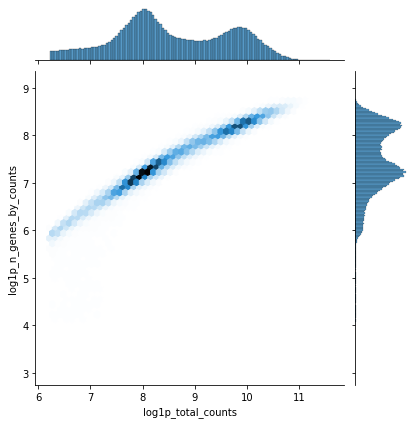

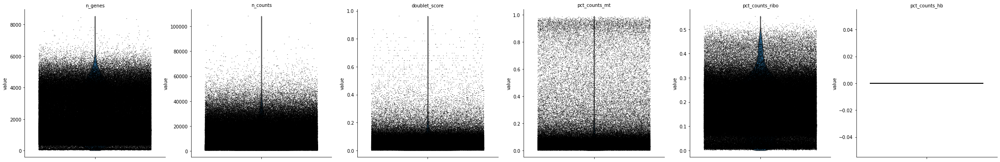

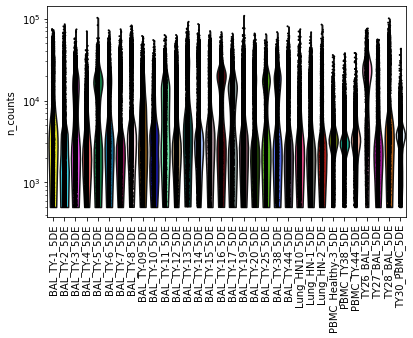

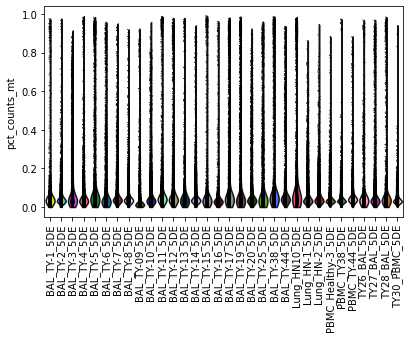

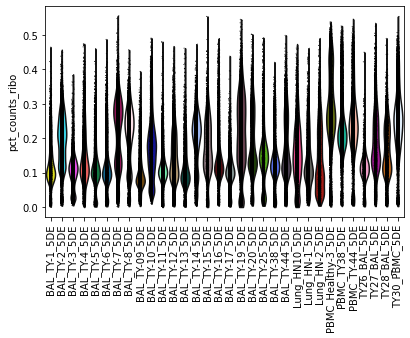

...

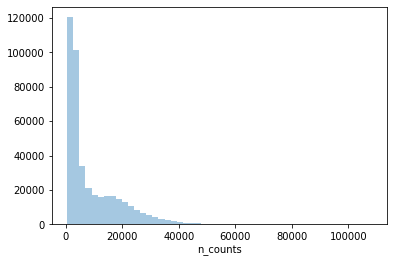

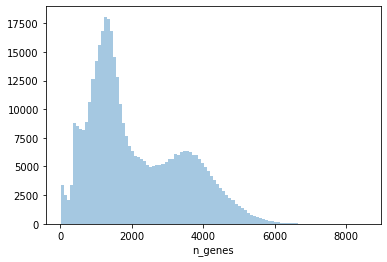

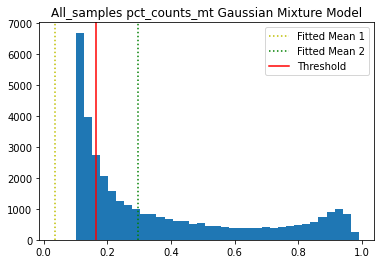

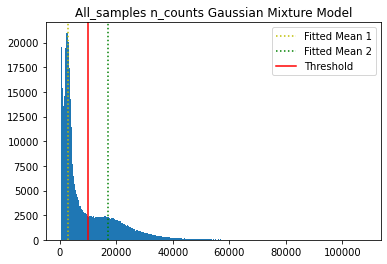

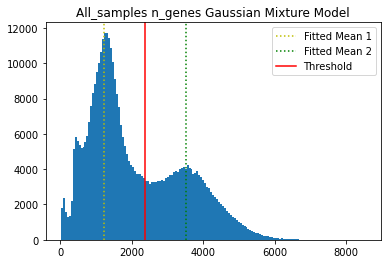

filtered out 0 cells that have less than 174 counts
filtered out 6824 genes that are detected in less than 3 cells
filtered out 6824 genes that are detected in less than 3 cells
filtered out 0 cells that have more than 51092814 counts
filtered out 23141 cells that has over 16% reads belong to mitochondrial genes
filtered out 1025 cells that have less than 308 genes expressed
filtered out 1025 cells that have less than 308 genes expressed
filtered out 1254 cells that have over 5801 genes expressed


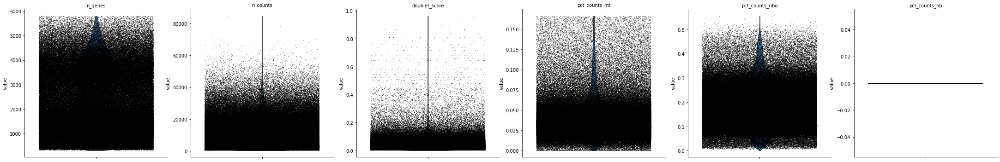

CPU times: user 1h 26min 46s, sys: 4min 9s, total: 1h 30min 56s
Wall time: 1h 26min 46s


In [10]:
%%time
adata = sc_pipe.qc_and_preprocess(adata,out_path, multi_sample=True)

normalizing counts per cell
    finished (0:00:05)
normalizing counts per cell
    finished (0:00:12)


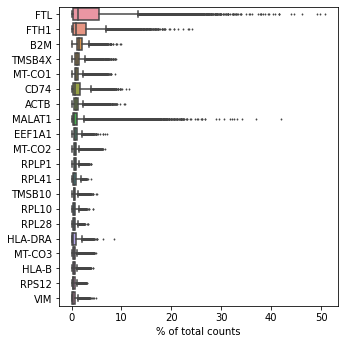

normalizing counts per cell
    finished (0:00:11)


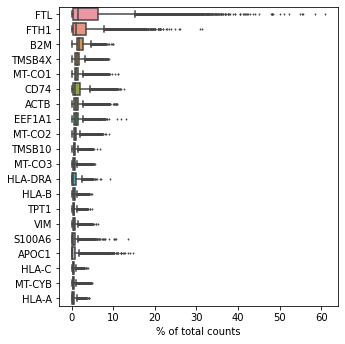

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:04)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


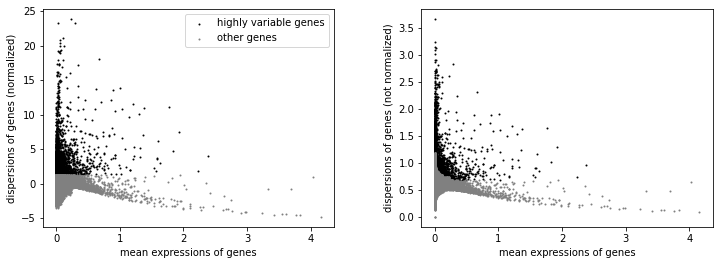

In [11]:
adata = sc_pipe.feature_selection(adata, out_path, exclude_genes)


In [12]:
adata

AnnData object with n_obs × n_vars = 394127 × 29260
    obs: 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'Sample', 'batch', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'doublet_score', 'predicted_doublet', 'n_counts', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'log_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sample_colors', 'log1p', 'hvg'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:01:16)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:03:24)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:20:04)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:07:59)
running Leiden clustering
    finished: found 27 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (2:50:42)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:01:29)
--> added 'pos', the PAGA positions (adata.uns['paga'])


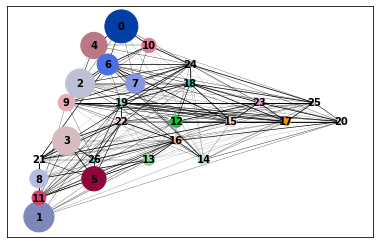

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:10:26)


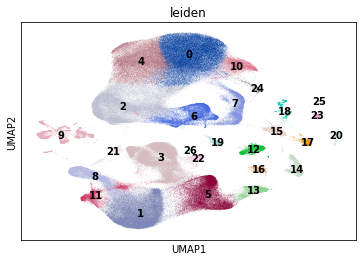

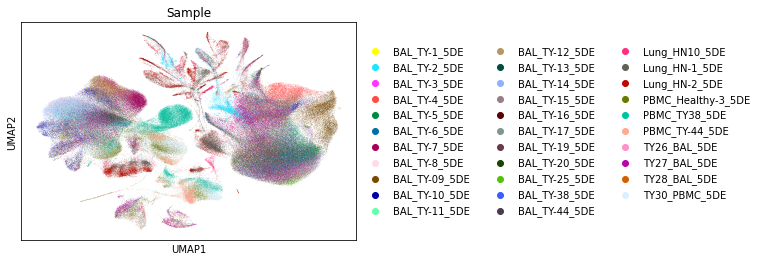

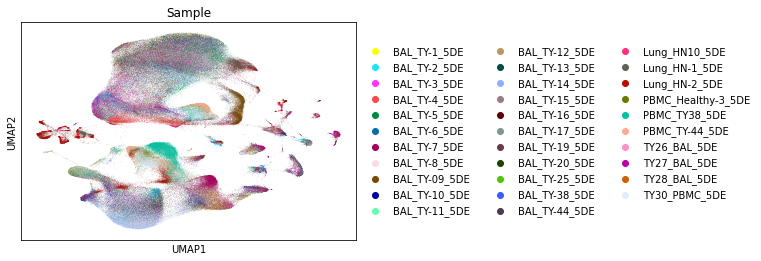

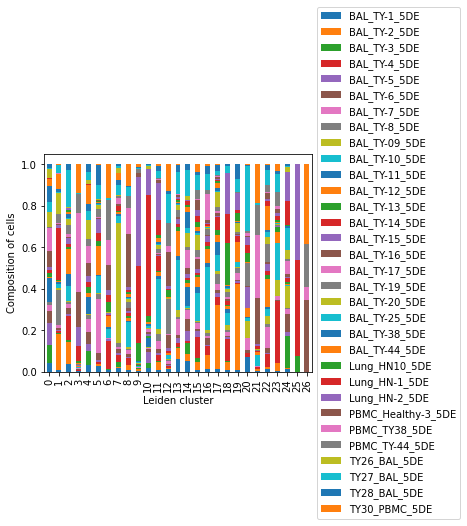

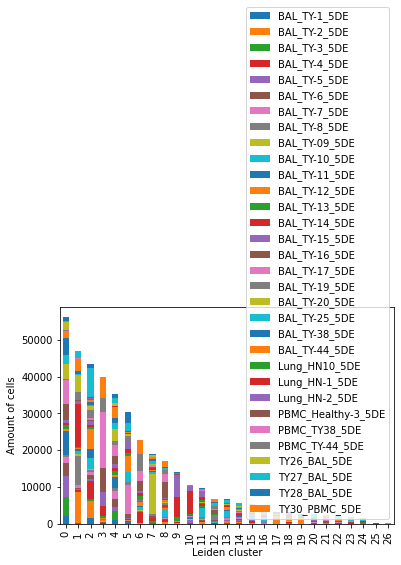

In [13]:
adata =  sc_pipe.BBKNN_clustering(adata,out_path, multi_sample=True, resol=1)
#adata = sc_pipe.clustering(adata,samples)

In [14]:
adata

AnnData object with n_obs × n_vars = 394127 × 29260
    obs: 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'Sample', 'batch', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'doublet_score', 'predicted_doublet', 'n_counts', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'log_counts', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sample_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'paga', 'leiden_sizes', 'leiden_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers:

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:04:35)


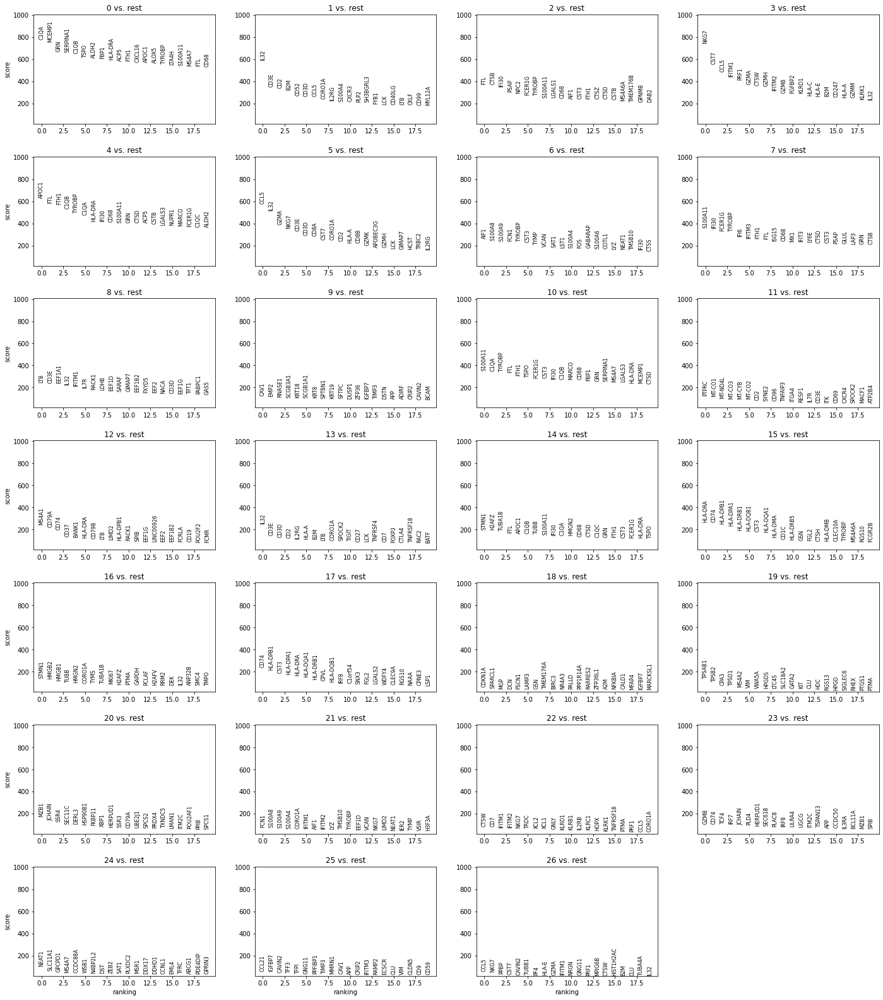

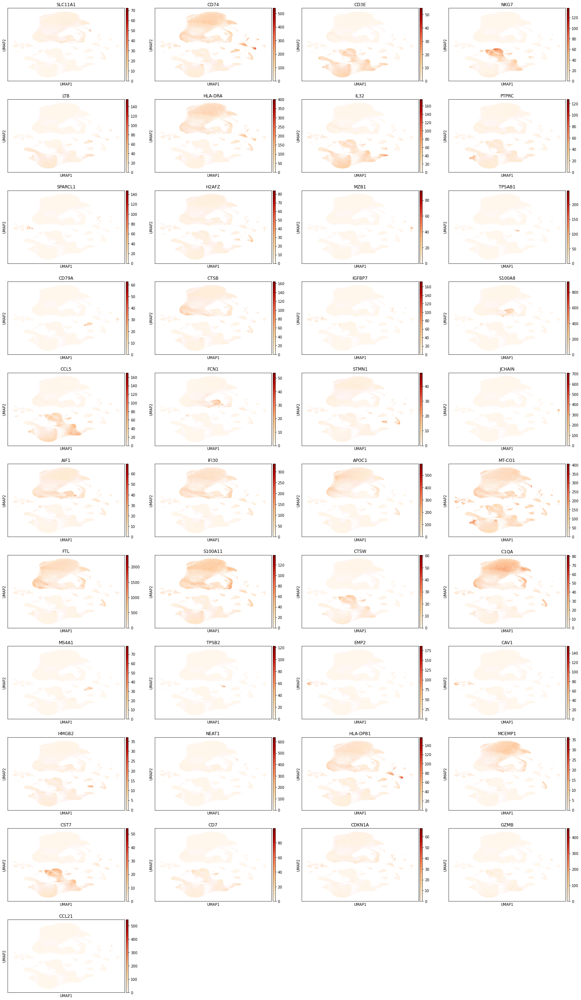

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


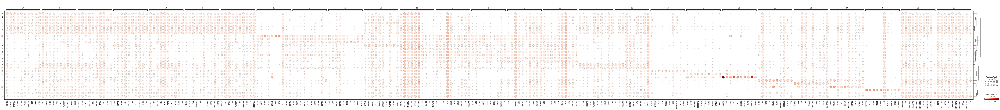

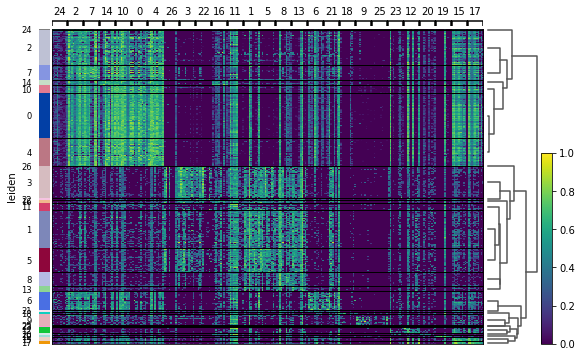

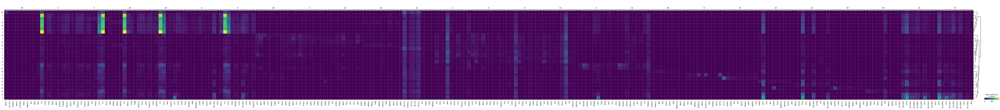

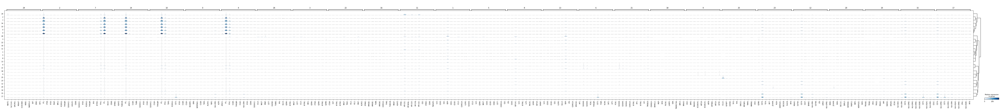

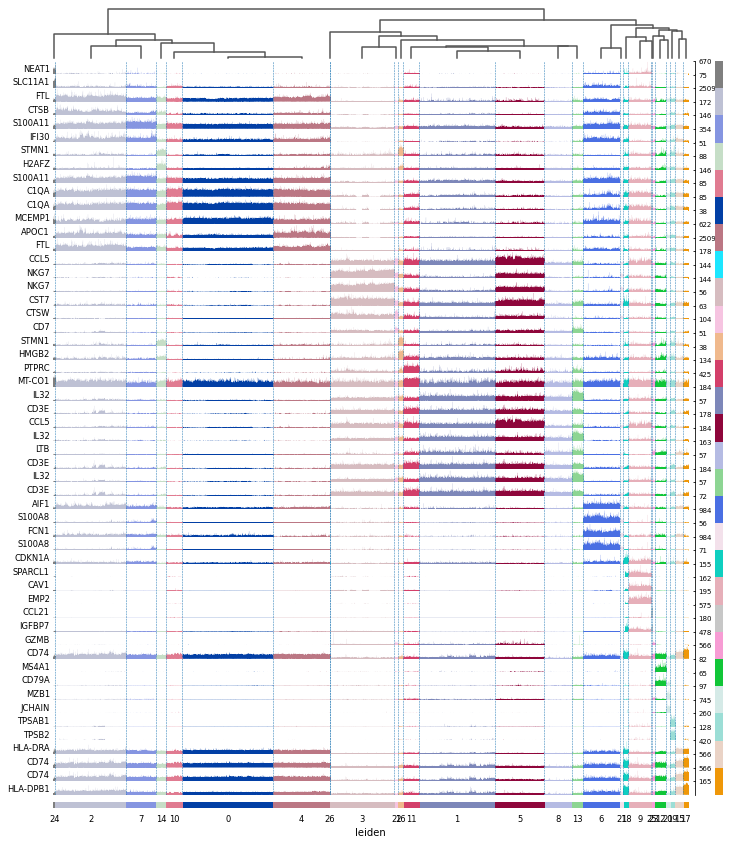

ranking genes
    finished: added to `.uns['rank_genes_samples']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:05:14)


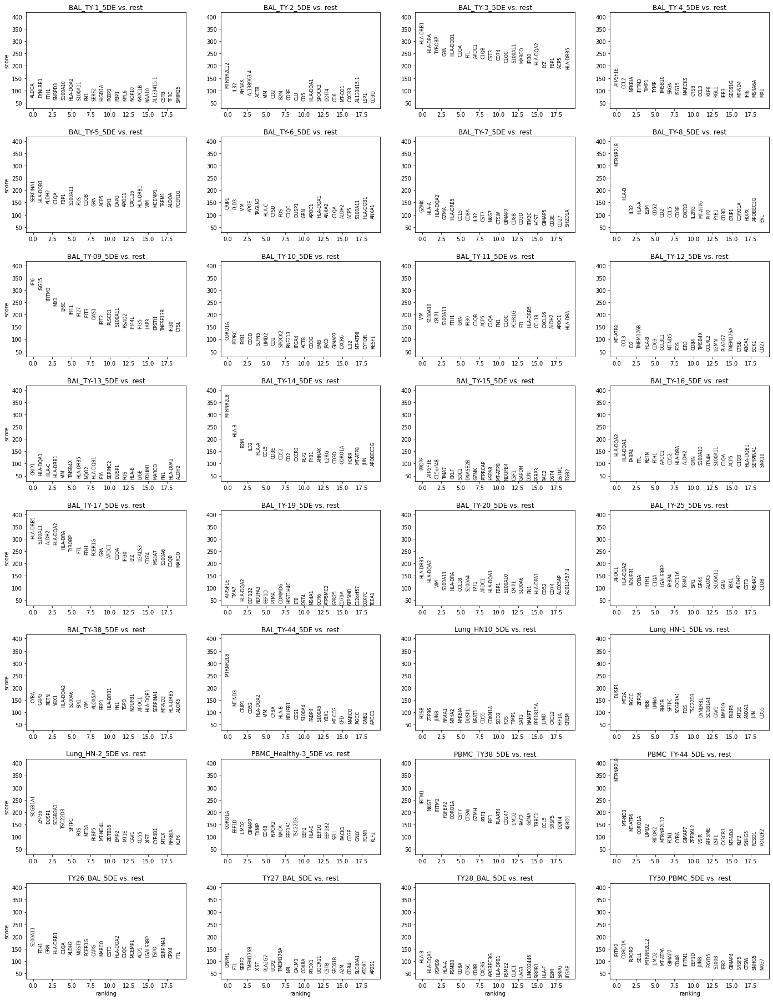

In [15]:
adata = sc_pipe.differential(adata,out_path, multi_sample = True)

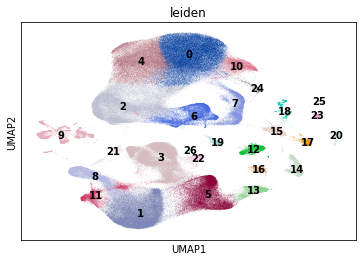

In [16]:
sc.pl.umap(adata, color='leiden',legend_loc='on data')

In [17]:
adata.write_h5ad(out_path+'/human_merged.h5ad')

In [18]:
adata=sc.read_h5ad(out_path+'/human_merged.h5ad')

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:31)
running ingest
    finished (0:12:21)


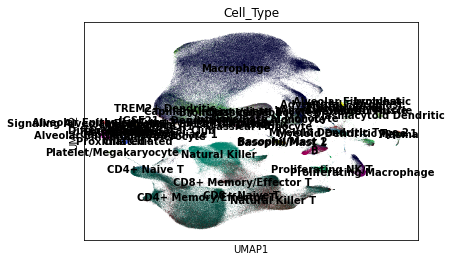

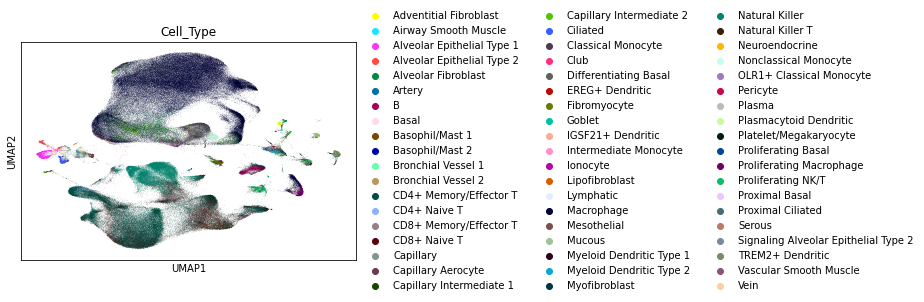

In [19]:
ad_ucsc=sc.read_h5ad('/user/ifrec/liuyuchen/Azimuth_ref/lung.h5ad')
sc.pp.neighbors(ad_ucsc)
ad_ingest = adata.copy()
var_names = ad_ucsc.var_names.intersection(ad_ingest.var_names)
ad_ucsc = ad_ucsc[:, var_names]
ad_ingest= ad_ingest[:, var_names]
sc.tl.ingest(ad_ingest, ad_ucsc, obs='Cell_Type')
adata.obs  = ad_ingest.obs
sc.pl.umap(adata, color='Cell_Type',legend_loc='on data')
sc.pl.umap(adata, color='Cell_Type')

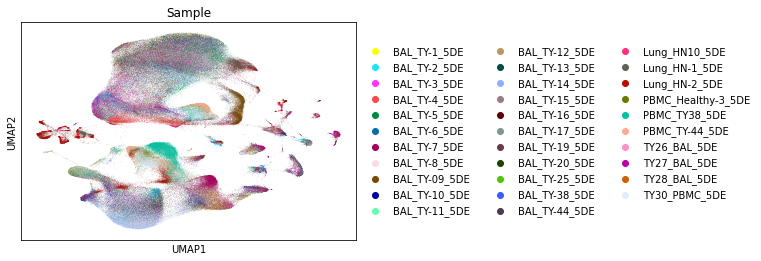

In [20]:
sc.pl.umap(adata, color='Sample')

In [21]:
adata.obs['Cell_Type'].value_counts()

Macrophage                              158382
CD4+ Memory/Effector T                   88560
Natural Killer                           33055
CD8+ Naive T                             27141
Capillary Intermediate 2                 12274
Classical Monocyte                       11406
Bronchial Vessel 1                        8512
Capillary                                 7497
CD8+ Memory/Effector T                    5960
Natural Killer T                          4539
B                                         4500
Alveolar Epithelial Type 1                3133
Nonclassical Monocyte                     2802
Proliferating Macrophage                  2582
Proliferating NK/T                        2360
Myeloid Dendritic Type 1                  2214
Ciliated                                  1905
Club                                      1527
Basophil/Mast 1                           1509
Myeloid Dendritic Type 2                  1380
Alveolar Epithelial Type 2                1349
Plasmacytoid 

In [22]:
adata.obs.Sample.value_counts()

PBMC_TY38_5DE         21796
TY27_BAL_5DE          19613
BAL_TY-2_5DE          17935
Lung_HN-1_5DE         17705
BAL_TY-14_5DE         17511
BAL_TY-10_5DE         17366
PBMC_Healthy-3_5DE    16667
BAL_TY-7_5DE          16147
Lung_HN-2_5DE         16047
BAL_TY-20_5DE         15895
BAL_TY-12_5DE         15162
BAL_TY-11_5DE         14887
BAL_TY-09_5DE         13971
TY30_PBMC_5DE         13121
BAL_TY-4_5DE          12947
BAL_TY-17_5DE         11671
BAL_TY-8_5DE          11629
BAL_TY-44_5DE         11378
PBMC_TY-44_5DE        11073
BAL_TY-19_5DE         10409
BAL_TY-6_5DE          10274
BAL_TY-5_5DE           9959
BAL_TY-3_5DE           9289
BAL_TY-16_5DE          8928
BAL_TY-38_5DE          8806
BAL_TY-1_5DE           8172
TY28_BAL_5DE           8117
BAL_TY-15_5DE          7289
BAL_TY-25_5DE          6547
Lung_HN10_5DE          5239
BAL_TY-13_5DE          4541
TY26_BAL_5DE           4036
Name: Sample, dtype: int64

In [23]:
adata.obs.Sample=adata.obs.Sample.apply(lambda x: '_'.join(str(x).split('_')[:2]))

In [24]:
adata.obs.Sample.value_counts()

PBMC_TY38         21796
TY27_BAL          19613
BAL_TY-2          17935
Lung_HN-1         17705
BAL_TY-14         17511
BAL_TY-10         17366
PBMC_Healthy-3    16667
BAL_TY-7          16147
Lung_HN-2         16047
BAL_TY-20         15895
BAL_TY-12         15162
BAL_TY-11         14887
BAL_TY-09         13971
TY30_PBMC         13121
BAL_TY-4          12947
BAL_TY-17         11671
BAL_TY-8          11629
BAL_TY-44         11378
PBMC_TY-44        11073
BAL_TY-19         10409
BAL_TY-6          10274
BAL_TY-5           9959
BAL_TY-3           9289
BAL_TY-16          8928
BAL_TY-38          8806
BAL_TY-1           8172
TY28_BAL           8117
BAL_TY-15          7289
BAL_TY-25          6547
Lung_HN10          5239
BAL_TY-13          4541
TY26_BAL           4036
Name: Sample, dtype: int64

In [25]:
adata.write_h5ad(out_path+'/human_merged.h5ad')

In [28]:
adata.obs.Sample.unique().tolist()

['BAL_TY-09',
 'BAL_TY-10',
 'BAL_TY-11',
 'BAL_TY-12',
 'BAL_TY-13',
 'BAL_TY-14',
 'BAL_TY-15',
 'BAL_TY-1',
 'BAL_TY-16',
 'BAL_TY-17',
 'BAL_TY-19',
 'BAL_TY-20',
 'BAL_TY-25',
 'BAL_TY-2',
 'BAL_TY-3',
 'BAL_TY-38',
 'BAL_TY-44',
 'BAL_TY-4',
 'BAL_TY-5',
 'BAL_TY-6',
 'BAL_TY-7',
 'BAL_TY-8',
 'Lung_HN10',
 'Lung_HN-1',
 'Lung_HN-2',
 'PBMC_Healthy-3',
 'PBMC_TY38',
 'PBMC_TY-44',
 'TY26_BAL',
 'TY27_BAL',
 'TY28_BAL',
 'TY30_PBMC']

In [29]:
to_use=['BAL_TY-09',
 'BAL_TY-11',
 'BAL_TY-12',
 'BAL_TY-13',
 'BAL_TY-15',
 'BAL_TY-1',
 'BAL_TY-16',
 'BAL_TY-17',
 'BAL_TY-19',
 'BAL_TY-20',
 'BAL_TY-2',
 'BAL_TY-3',
 'BAL_TY-38',
 'BAL_TY-44',
 'BAL_TY-4',
 'BAL_TY-5',
 'BAL_TY-6',
 'BAL_TY-7',
 'BAL_TY-8',
 'Lung_HN10',
 'Lung_HN-1',
 'Lung_HN-2',
 'PBMC_Healthy-3',
 'PBMC_TY38',
 'PBMC_TY-44',
 'TY26_BAL',
 'TY27_BAL',
 'TY28_BAL',
 'TY30_PBMC']

In [30]:
len(to_use)

29

In [32]:
adata=adata[adata.obs['Sample'].isin(to_use)]

In [33]:
adata.write_h5ad(out_path+'/human_merged_0628.h5ad')

In [34]:
from pyBCS import scanpy2bcs
scanpy2bcs.format_data(out_path+'/human_merged_0628.h5ad', out_path+'/human_merged_0628.bcs',
                        input_format="h5ad", graph_based="leiden")

Writing main/metadata/metalist.json
Cannot convert Sample to numeric, treating as categorical
Cannot convert leiden to numeric, treating as categorical
Cannot convert Cell_Type to numeric, treating as categorical
"predicted_doublet" is not numeric or categorical, ignoring
Found graph based clustering in metadata with keyword leiden
Writing main/metadata/ad539533d5ef407d8fc60ad3cd3e87df.json
Writing main/metadata/3440b692ca2645bc86bf76bd02dc66fd.json
Writing main/metadata/c5104402be75490da92f86b68167b38e.json
Writing main/metadata/5509487e36dd45e38c697cdfd34ac879.json
Writing main/metadata/58a758574d294c618f7faa417a0ea95b.json
Writing main/metadata/d0e9b160d1044168b52ffe1669b59638.json
Writing main/metadata/3d1b7f3a8ba4472aa68fafdda6aa6792.json
Writing main/metadata/1d6d113743194c1aa4dd1b3dbde1cb0a.json
Writing main/metadata/784a7db5726c4a999e3075be5da0e4a0.json
Writing main/metadata/8be204bd48b241dda39c44410530969e.json
Writing main/metadata/fb4ecbd9c94c490088d13eaf08b03869.json
Writin

'/user/ifrec/liuyuchen/Analysis_Reports/Akira_Fukusima_scRNASeq/human//human_merged_0628.bcs'

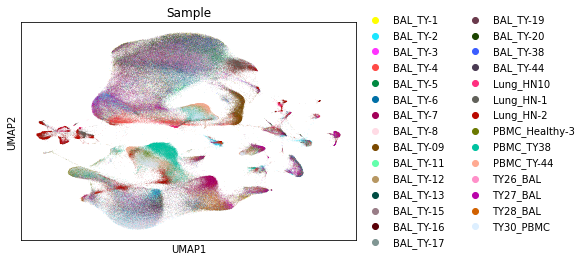

In [35]:
sc.pl.umap(adata, color='Sample')